# PROGENy with single cell (not pseudo bulk)

## [The PROGENy model](https://decoupler-py.readthedocs.io/en/latest/notebooks/progeny.html#PROGENy-model)

>PROGENy is a comprehensive resource containing a curated collection of pathways and their target genes, with weights for each interaction. [...] we will use the human weights (other organisms are available) and we will use the top 500 responsive genes ranked by p-value. Here is a brief description of each pathway:
> - Androgen: involved in the growth and development of the male reproductive organs.
> - EGFR: regulates growth, survival, migration, apoptosis, proliferation, and differentiation in mammalian cells
> - Estrogen: promotes the growth and development of the female reproductive organs.
> - Hypoxia: promotes angiogenesis and metabolic reprogramming when O2 levels are low.
> - JAK-STAT: involved in immunity, cell division, cell death, and tumor formation.
> - MAPK: integrates external signals and promotes cell growth and proliferation.
> - NFkB: regulates immune response, cytokine production and cell survival.
> - p53: regulates cell cycle, apoptosis, DNA repair and tumor suppression.
> - PI3K: promotes growth and proliferation.
> - TGFb: involved in development, homeostasis, and repair of most tissues.
> - TNFa: mediates haematopoiesis, immune surveillance, tumour regression and protection from infection.
> - Trail: induces apoptosis.
> - VEGF: mediates angiogenesis, vascular permeability, and cell migration.
> - WNT: regulates organ morphogenesis during development and tissue repair.

In [7]:
import decoupler as dc

progeny = dc.get_progeny(organism='human', top=200)
progeny

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
2795,p53,KLC3,2.138088,2.434639e-09
2796,p53,RNASE7,4.776755,2.730602e-09
2797,p53,CDH10,5.802510,2.772294e-09
2798,p53,CFHR4,2.582037,2.883922e-09


## [Activity inference with multivariate linear model (MLM)](https://decoupler-py.readthedocs.io/en/latest/notebooks/progeny.html#Activity-inference-with-multivariate-linear-model-(MLM))

> To infer pathway enrichment scores we will run the multivariate linear model (``mlm``) method. For each cell in our dataset (``adata``), it fits a linear model that predicts the observed gene expression based on all pathways’ Pathway-Gene interactions weights. Once fitted, the obtained t-values of the slopes are the scores. If it is positive, we interpret that the pathway is active and if it is negative we interpret that it is inactive.
> ![](https://decoupler-py.readthedocs.io/en/latest/_images/mlm.png)

In [ ]:
input_file = "../../results/merged/chosen_branch/adata_subset.h5ad"
output_file = "../../results/merged/chosen_branch/progeny.csv"
clusters_file = "../../results/merged/chosen_branch/clusters_scmiko_subset_chosen_res.csv"

In [9]:
import scanpy as sc
import pandas as pd

adata = sc.read(input_file)
clusters = pd.read_csv(clusters_file, index_col=0)
adata.obs['clusters'] = clusters.astype('category')
adata.X = adata.layers['counts']

In [ ]:
# if use_ensembl_ids:
# instead check if the var names start with ENSG?
if adata.var_names.str.startswith('ENSG').all():
	ensembl2_symbol = pd.read_csv("../../resources/ensembl2genes_cellranger.tsv", sep="\t", header=None, index_col=0)
	ensembl2_symbol = ensembl2_symbol[1].to_dict()
	adata.var['hgnc_symbol'] = adata.var_names.map(ensembl2_symbol)
	adata.var['ensembl_id'] = adata.var_names
	adata.var_names = adata.var['hgnc_symbol']

adata.var_names

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Settings
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    # frameon=False,
    figsize=(6, 6),
)

# Custom plotting function
# adapted from https://github.com/scverse/scanpy/issues/2333#issuecomment-1563790561
def split_dim_plot(adata, split_by, embedding="umap", color=None, ncol=5, nrow=None, **kwargs):
    size = 120000 / len(adata.obs_names) * len(adata.obs[split_by].unique()) / 1.2  # Keep point size constant
    categories = adata.obs[split_by].cat.categories
    if nrow is None:
        nrow = int(np.ceil(len(categories) / ncol))
    
    # Update global font sizes
    plt.rcParams.update({
        "font.size": 14,  # General font size
        "axes.titlesize": 18,  # Subplot title size
        "legend.fontsize": 14,  # Legend font size
        "xtick.labelsize": 14,  # X-axis labels
        "ytick.labelsize": 14   # Y-axis labels
    })
    
    fig, axs = plt.subplots(nrow, ncol, figsize=(5*ncol, 5*nrow))
    axs = axs.flatten()

    # Plot individual subplots
    for i, cat in enumerate(categories):
        ax = axs[i]
        
        # Plot background (all cells in light gray)
        sc.pl.embedding(adata, basis=embedding, color=None, size=size, show=False, ax=ax, na_color="#EEEEEE")
        
        # Plot current category with color
        sc.pl.embedding(
            adata[adata.obs[split_by] == cat], 
            basis=embedding, 
            color=color, 
            ax=ax, 
            show=False, 
            title=cat, 
            size=size, 
            legend_loc=None,  # Remove individual legends
            **kwargs
        )
    
        ax.set_title(cat, fontsize=18)  # Set larger font for subplot titles

    # Hide unused subplots if any
    for j in range(i + 1, len(axs)):
        axs[j].axis("off")

    # Create common legend
    if color and color in adata.obs:
        unique_categories = adata.obs[color].cat.categories
        colors = adata.uns.get(color + "_colors", plt.cm.tab10(range(len(unique_categories))))  # Get colors
        
        legend_patches = [plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=c, markersize=12, label=cat)
                          for cat, c in zip(unique_categories, colors)]

        fig.legend(handles=legend_patches, loc="lower center", ncol=min(len(unique_categories), 5), fontsize=16)  # Bigger legend
        unique_categories = adata.obs[color].cat.categories
        colors = adata.uns.get(color + "_colors", plt.cm.tab10(range(len(unique_categories))))  # Get colors
        
        legend_patches = [plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=c, markersize=12, label=cat)
                          for cat, c in zip(unique_categories, colors)]

        fig.legend(handles=legend_patches, loc="lower center", ncol=min(len(unique_categories), 5), fontsize=16)  # Bigger legend

    # Adjust layout to make space for legend
    plt.tight_layout(rect=[0, 0.05, 1, 1])

    # plt.show()

In [11]:
dc.run_mlm(
    mat=adata,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

1284 features of mat are empty, they will be removed.
Running mlm on mat with 22799 samples and 16798 targets for 14 sources.


  0%|          | 0/3 [00:00<?, ?it/s]

In [12]:
adata.obsm['mlm_estimate']

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
GTAAGAACAGCTTTCGAACGGGAA-1,-0.668298,0.520833,-1.085033,0.604117,-0.956228,1.466104,-0.549565,1.403570,0.570899,-0.305018,-2.117523,0.263517,-0.776088,-0.353155
TGAATGTCACAGCAACATCCCAAC-1,0.608388,-0.025452,-0.855570,0.792281,-1.343117,4.983139,0.530626,0.815965,1.496365,0.094650,-0.215088,0.518655,-0.173523,0.190415
AAAGCGAAGCGATGGCATCCCAAC-1,-0.767587,-0.368364,0.528005,1.624010,-2.073922,3.913573,0.161405,-0.251787,1.334054,0.669135,-3.386087,0.467888,0.808677,-0.930782
ATGCGATAGTTGCGGAACAGACCT-1,-0.122567,-0.179465,-2.341321,4.286760,-0.315502,1.963011,0.398237,-0.620769,3.590056,-0.692230,-0.570059,1.242098,-2.146780,0.528004
AACTTACTCGCTATATACAGACCT-1,0.208949,0.197964,-1.225622,2.459130,-0.943174,0.630824,0.014189,-0.295887,0.812201,-0.519305,-0.147961,0.043121,-0.047430,-0.435775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGAATAGGTCCACAATAGAGGCAA-1,0.380810,-0.278257,-1.076259,1.955874,-1.243377,2.140682,0.071942,0.361535,-0.766525,-0.338671,-0.725768,0.099966,-0.633210,0.824930
ACAGGTAGTAATGCGAAACGCCGA-1,-0.183430,0.569034,-0.497263,0.759513,-0.980251,-1.455794,-0.228974,1.117812,-0.660328,-0.442409,-1.576172,0.058386,0.331060,-0.730614
CTTAGCTCATCATGCTACAGTCTG-1,-0.322742,-2.317572,-1.566680,0.418826,0.235700,4.919580,1.422740,-0.553194,0.606112,-0.475947,-2.016105,0.656829,-3.859250,-0.176985
TAACGCCTCTCCATCTATACGTCA-1,0.158754,0.044116,-1.318990,1.173531,-0.767020,3.432236,0.765729,0.101619,7.348285,-0.532124,-0.159127,0.041572,-0.036152,2.861416


In [13]:
adata.obsm['progeny_mlm_estimate'] = adata.obsm['mlm_estimate'].copy()
adata.obsm['progeny_mlm_pvals'] = adata.obsm['mlm_pvals'].copy()
acts = dc.get_acts(adata, obsm_key='mlm_estimate')
acts

AnnData object with n_obs × n_vars = 22799 × 14
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'soupx_contamination', 'scDblFinder_score', 'scDblFinder_class', 'size_factors', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_1', 'leiden_2', 'CMS1_score', 'CMS2_score', 'CMS3_score', 'CMS4_score', 'CMS', 'celltypist_cell_label_gut', 'celltypist_conf_score_gut', 'celltypist_cell_label_crc', 'celltypist_conf_score_crc', 'treatment', 'week', 'sample', 'S_score', 'G2M_score', 'phase', 'cell_cycle_diff', 'clusters'
    uns: 'diffmap_evals', 'hvg', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'treatment_colors', 'tsne', 'umap', 'week_colors'
    obsm: 'X_diffmap', 'X_pca', 'X_tsne

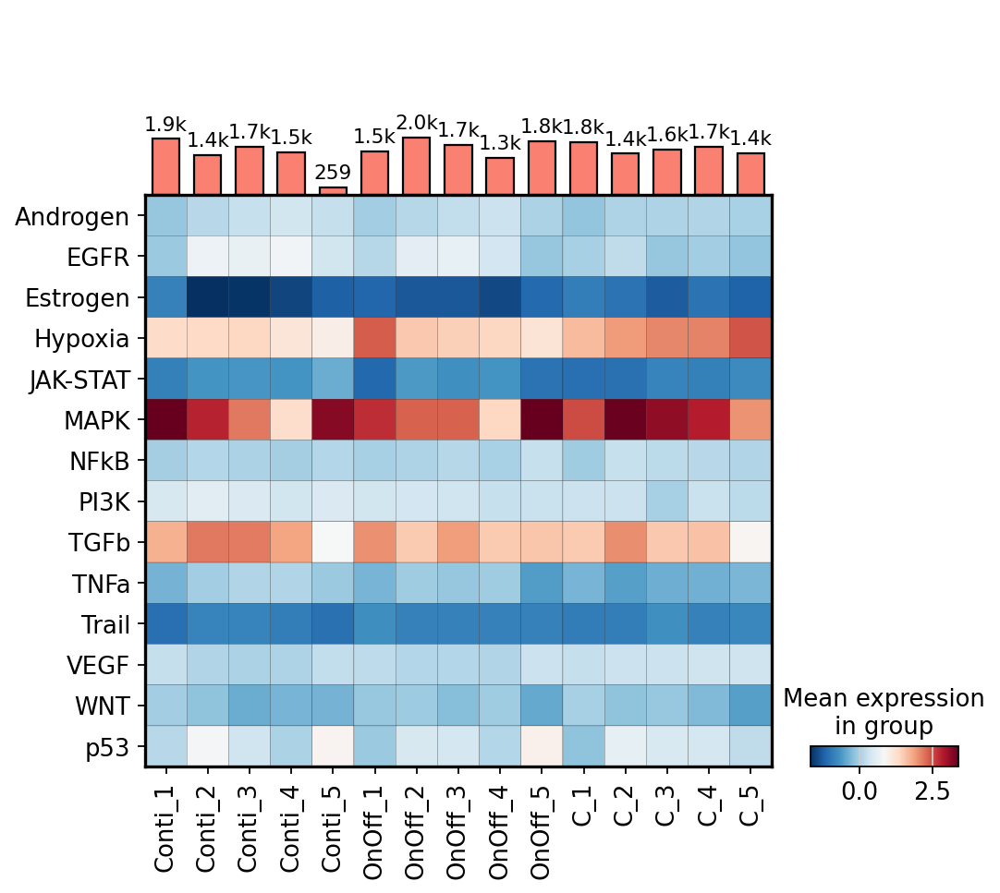

In [ ]:
mp = sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='sample', dendrogram=False,
                      standard_scale=None, log = False, swap_axes=True, 
                      cmap='RdBu_r', show=False, return_fig=True)
mp.add_totals().style(edge_color='black').show()

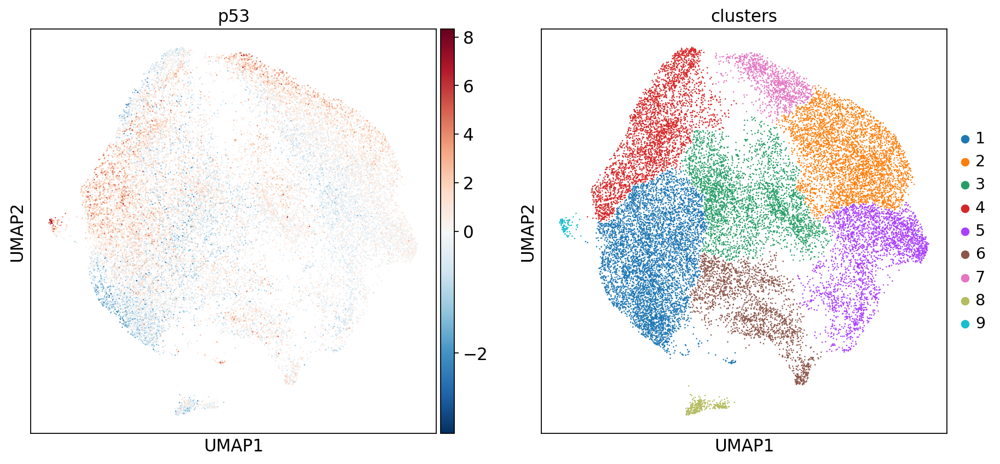

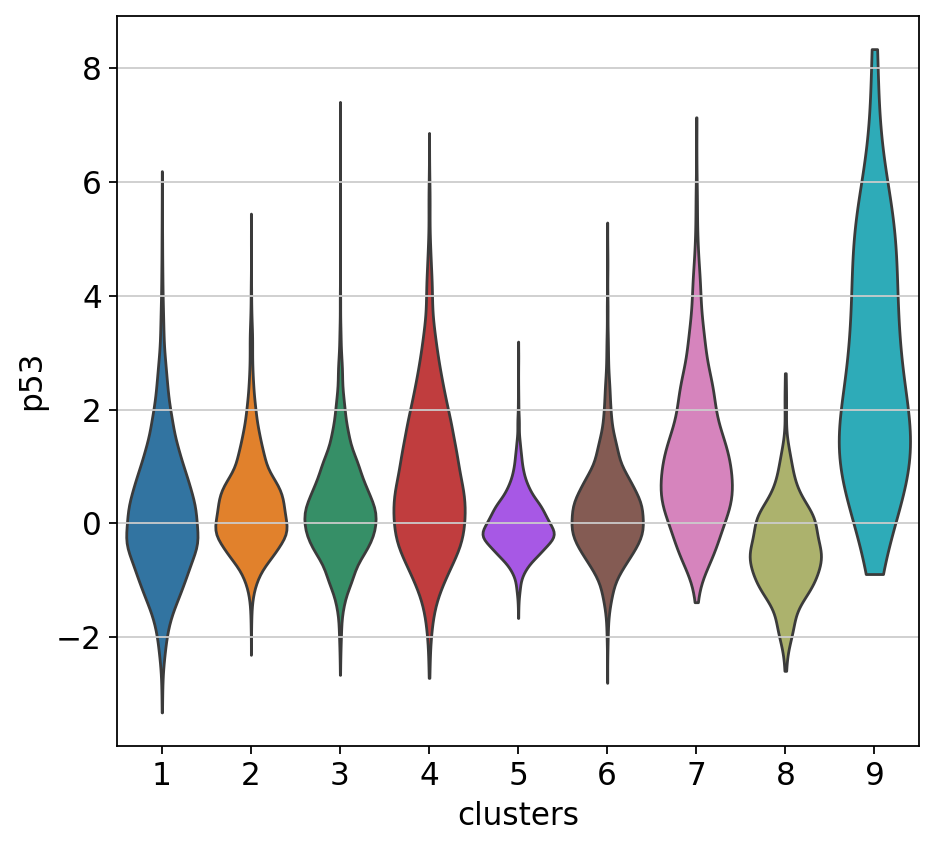

In [15]:
sc.pl.umap(acts, color=['p53', 'clusters'], cmap='RdBu_r', vcenter=0)
sc.pl.violin(acts, keys=['p53'], groupby='clusters', stripplot=False, legend=False)

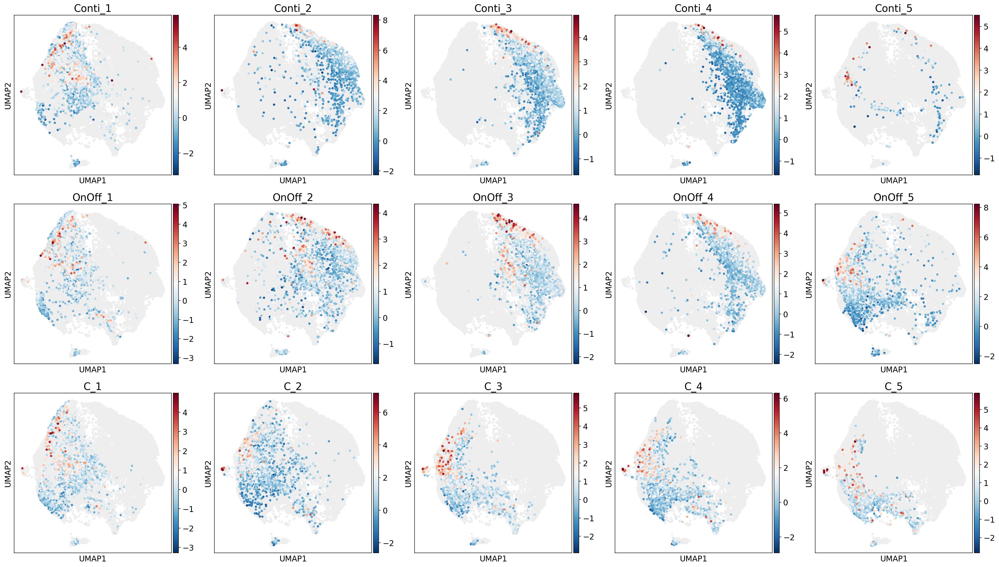

In [16]:
split_dim_plot(acts, 'sample', "umap", color = 'p53', ncol = 5, cmap='RdBu_r')

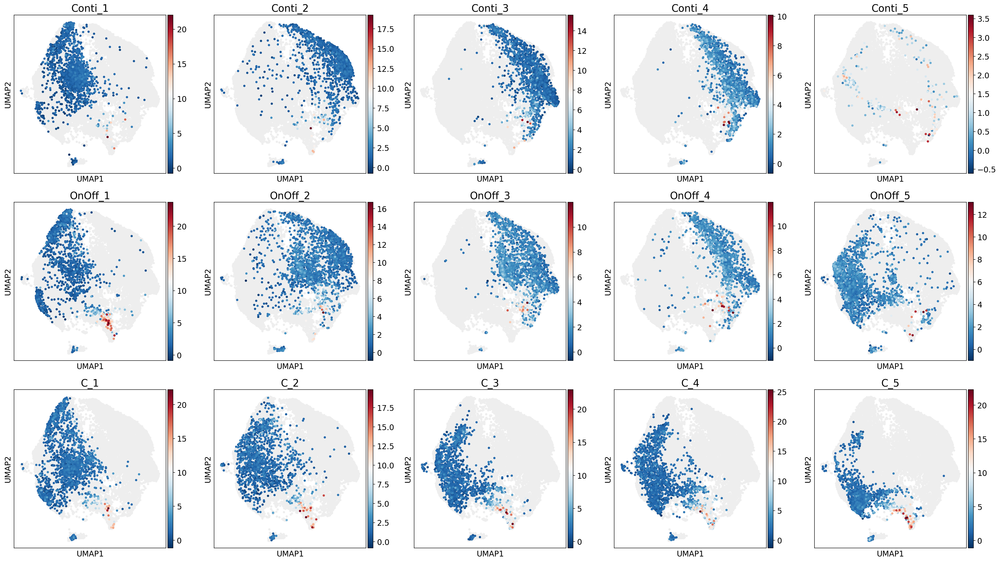

In [17]:
split_dim_plot(acts, 'sample', "umap", color = 'Hypoxia', ncol = 5, cmap='RdBu_r')

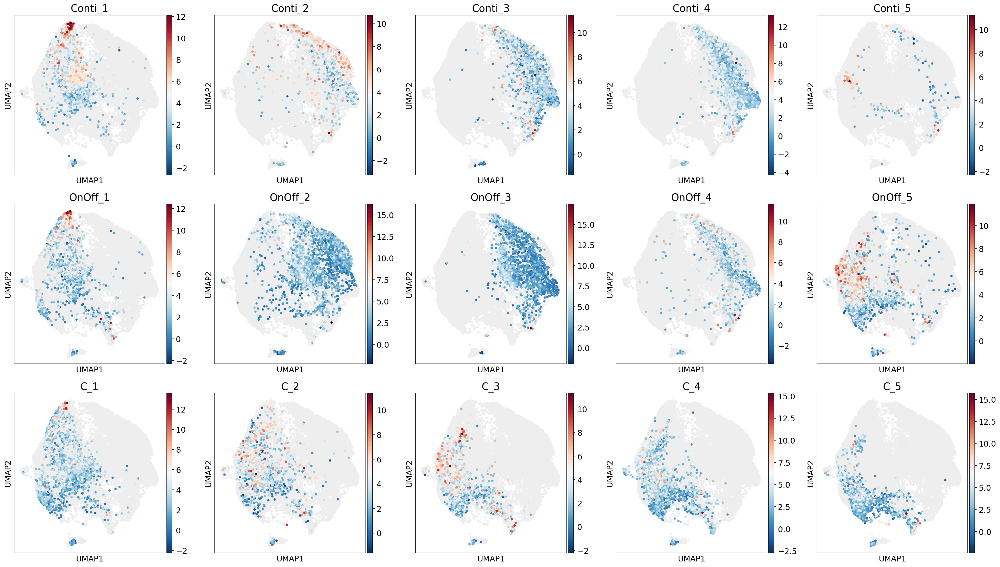

In [18]:
split_dim_plot(acts, 'sample', "umap", color = 'MAPK', ncol = 5, cmap='RdBu_r')

- log?
    - scores are mostly between -2 and 2, log transformation is unnecessary and may even distort the data.
- scale?
    - scaling per pathway/variable will inflate the variance of the variable because the samples are already quite similar (no different cell types)
    - scaling per sample/group will render incomparable the samples among themselves because the value of an unchanged pathway might differ (drastically) only because another pathway's score changed

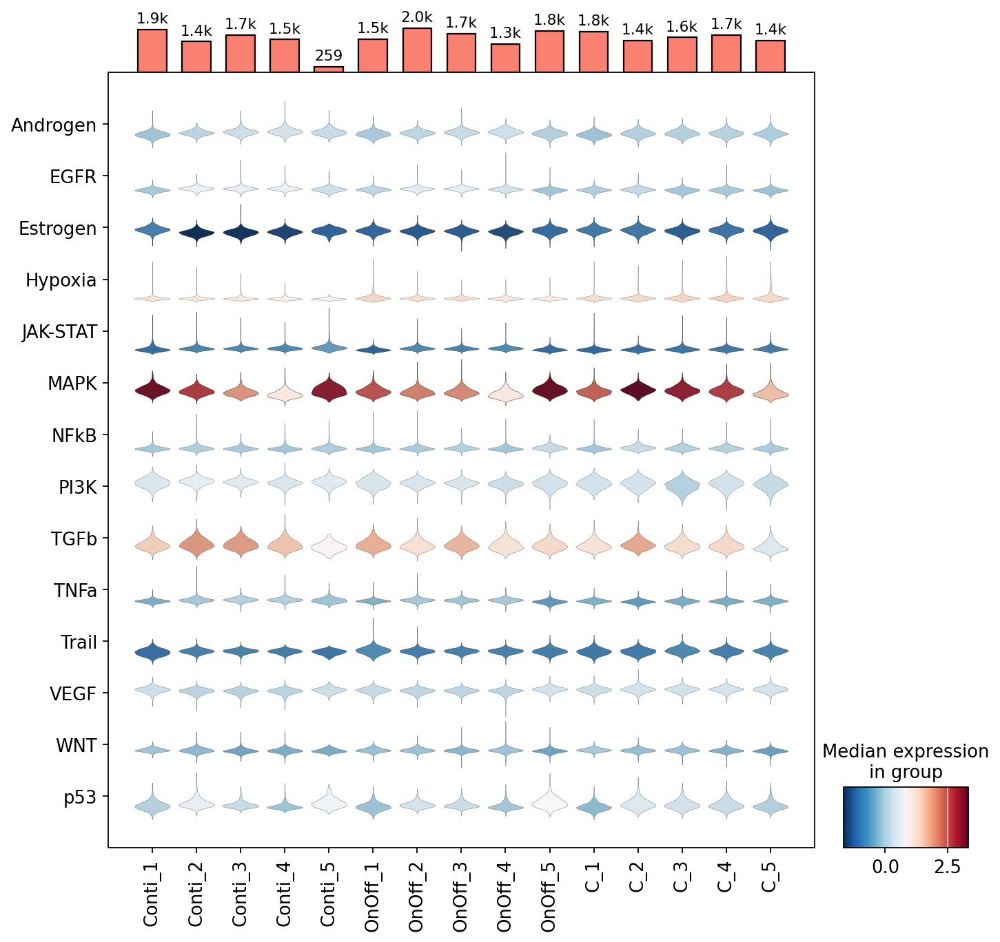

In [19]:
vp = sc.pl.stacked_violin(acts, acts.var_names, groupby="sample", swap_axes=True, dendrogram=False, standard_scale=None, figsize=(10, 10), cmap='RdBu_r', return_fig=True)
vp.add_totals().style().show()

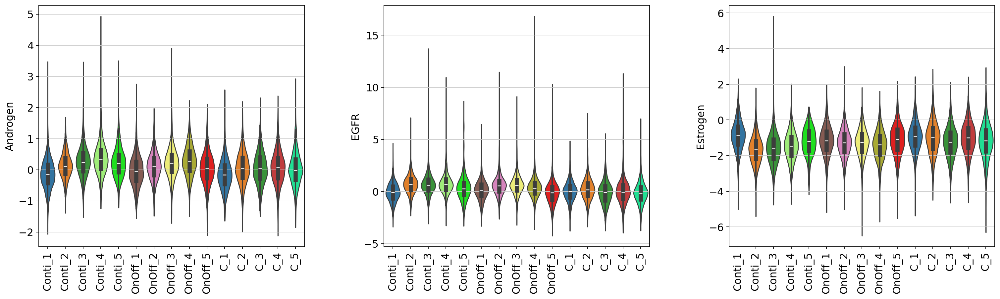

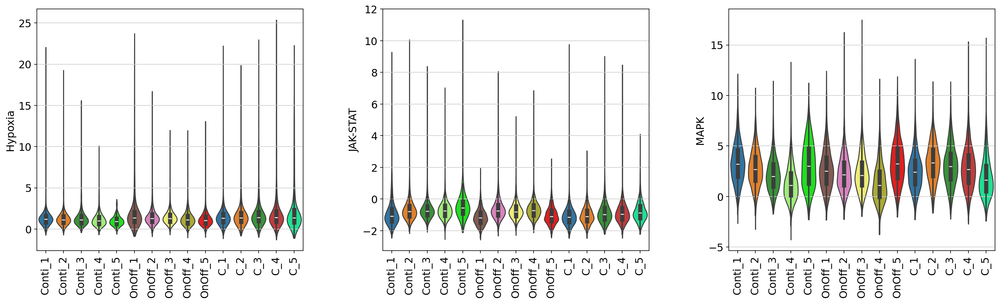

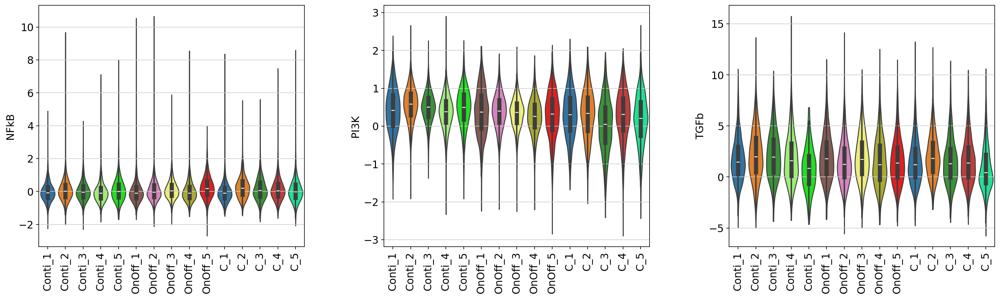

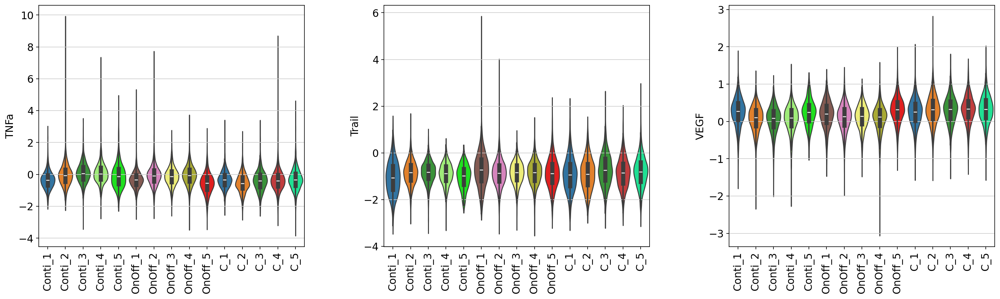

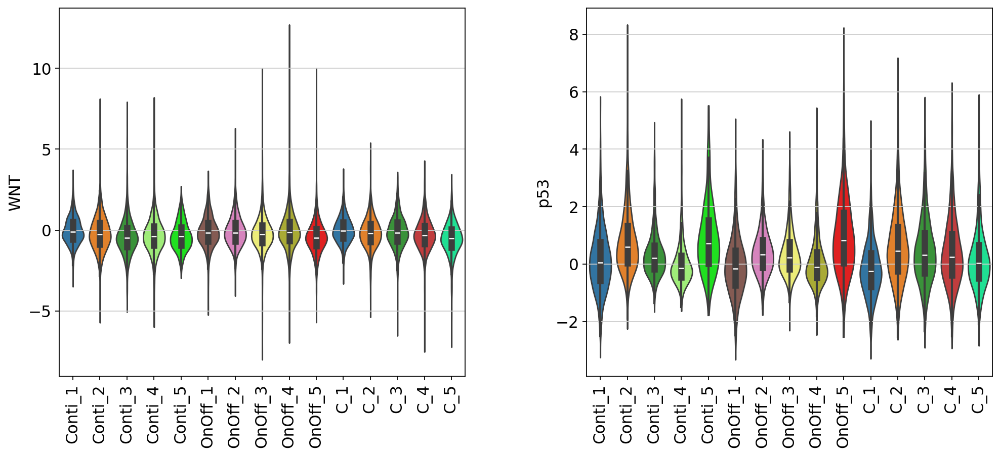

In [20]:
sc.pl.violin(acts, keys=acts.var_names[0:3], groupby='sample', stripplot=False, inner="box", rotation = 90)
sc.pl.violin(acts, keys=acts.var_names[3:6], groupby='sample', stripplot=False, inner="box", rotation = 90)
sc.pl.violin(acts, keys=acts.var_names[6:9], groupby='sample', stripplot=False, inner="box", rotation = 90)
sc.pl.violin(acts, keys=acts.var_names[9:12], groupby='sample', stripplot=False, inner="box", rotation = 90)
sc.pl.violin(acts, keys=acts.var_names[12:14], groupby='sample', stripplot=False, inner="box", rotation = 90)

# [Pseudo-bulk](https://decoupler-py.readthedocs.io/en/latest/notebooks/pseudobulk.html#Generation-of-pseudo-bulk-profiles)

> After the annotation of clusters into cell identities, we often would like to perform differential expression analysis (DEA) between conditions within particular cell types to further characterize them. DEA can be performed at the single-cell level, but the obtained p-values are often inflated as each cell is treated as a sample. We know that single cells within a sample are not independent of each other, since they were isolated from the same environment. If we treat cells as samples, we are not testing the variation across a population of samples, rather the variation inside an individual one. Moreover, if a sample has more cells than another it might bias the results.
>
>The current best practice to correct for this is using a pseudo-bulk approach (Squair J.W., et al 2021), which involves the following steps:
>- Subsetting the cell type(s) of interest to perform DEA.
>- Extracting their raw integer counts.
>- Summing their counts per gene into a single profile if they pass quality control.
>- Performing DEA if at least two biological replicates per condition are available (more replicates are recommended).

In [21]:
# subset week 2, 3 and 4
adata_subset = adata[adata.obs['week'].isin(["2", "3", "4"])].copy()
# Get pseudo-bulk profile # does not work with scipy version >=1.15
pdata = dc.get_pseudobulk(
    adata_subset,
    sample_col="week",
    groups_col="treatment",
    layer='counts',
    mode='sum',
    min_cells=0,
    min_counts=0
)

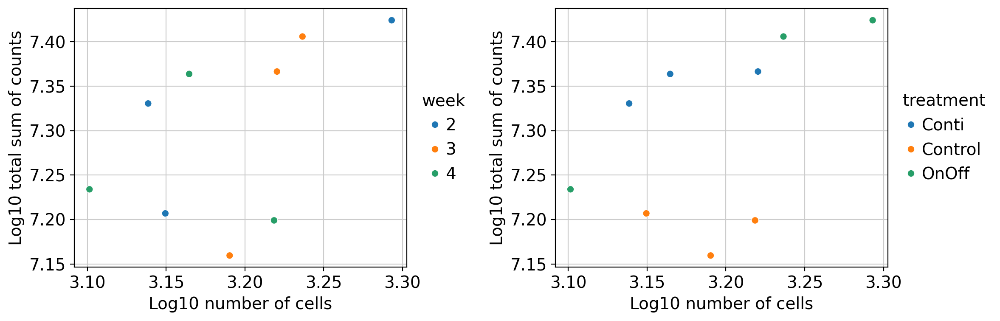

In [22]:
dc.plot_psbulk_samples(pdata, groupby=['week', 'treatment'], figsize=(12, 4))

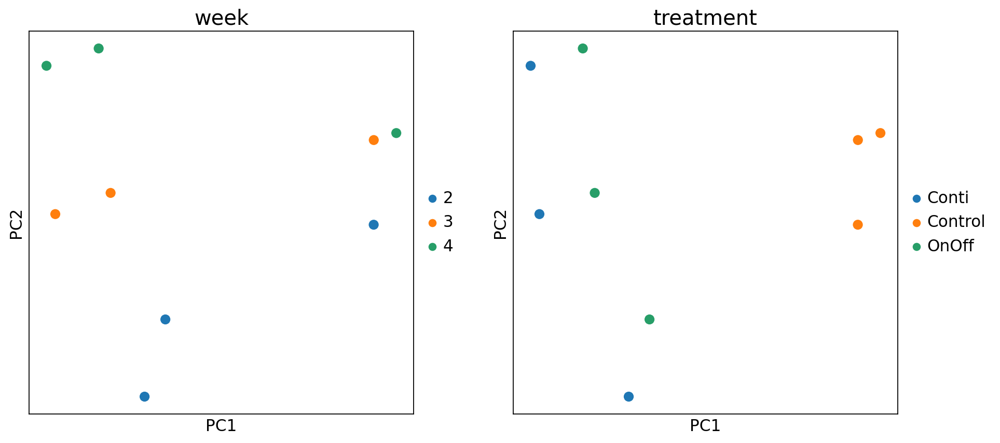

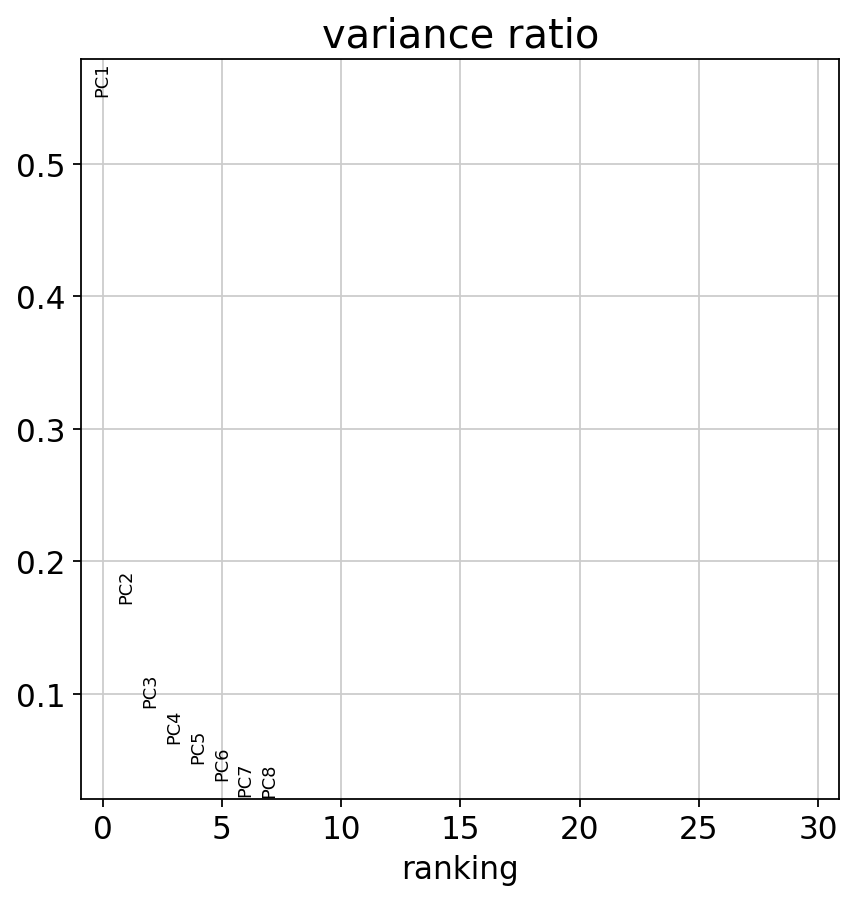

In [23]:
# Store raw counts in layers
pdata.layers['counts'] = pdata.X.copy()

# Normalize, scale and compute pca
sc.pp.normalize_total(pdata, target_sum=1e4)
sc.pp.log1p(pdata)
sc.pp.scale(pdata, max_value=10)
sc.tl.pca(pdata)

# Return raw counts to X
dc.swap_layer(pdata, 'counts', X_layer_key=None, inplace=True)

sc.pl.pca(pdata, color=['week', 'treatment'], ncols=2, size=300)
sc.pl.pca_variance_ratio(pdata)

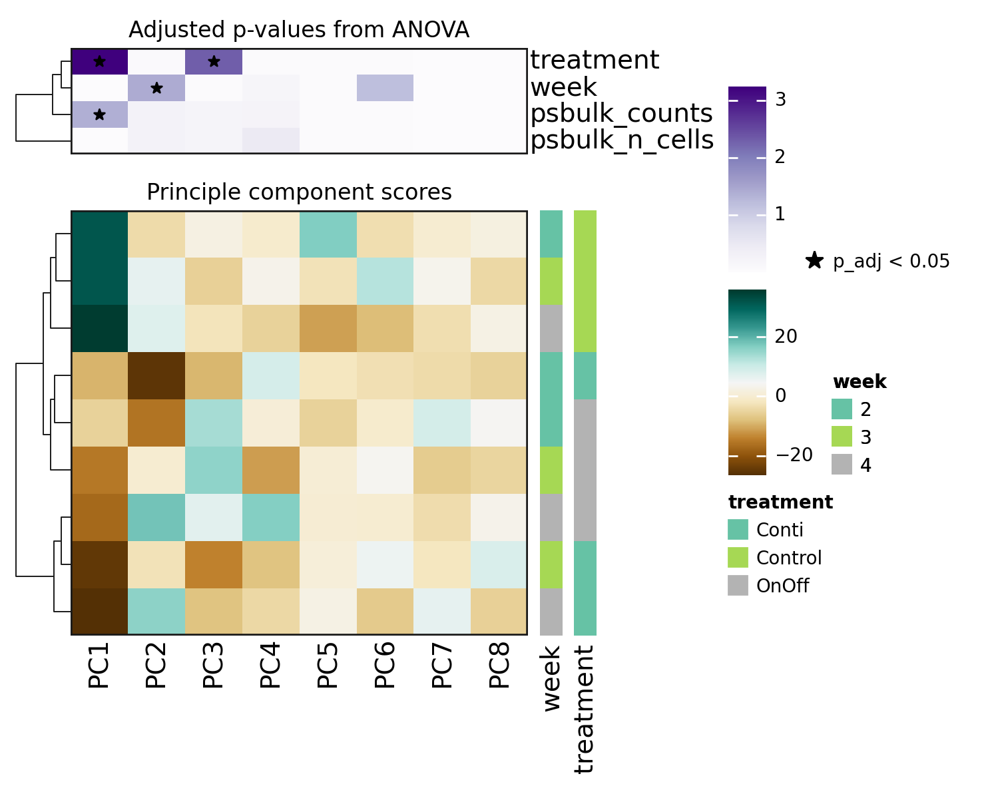

In [24]:
dc.get_metadata_associations(
    pdata,
    obs_keys = ['week', 'treatment', 'psbulk_n_cells', 'psbulk_counts'],  # Metadata columns to associate to PCs
    obsm_key='X_pca',  # Where the PCs are stored
    uns_key='pca_anova',  # Where the results are stored
    inplace=True,
)

dc.plot_associations(
    pdata,
    uns_key='pca_anova',  # Summary statistics from the anova tests
    obsm_key='X_pca',  # where the PCs are stored
    stat_col='p_adj',  # Which summary statistic to plot
    obs_annotation_cols = ['week', 'treatment'], # which sample annotations to plot
    titles=['Principle component scores', 'Adjusted p-values from ANOVA'],
    figsize=(7, 5),
    n_factors=10,
)

Keep genes that have a minimum total number of reads across samples (min_total_count), and that have a minimum number of counts in a number of samples (min_count).

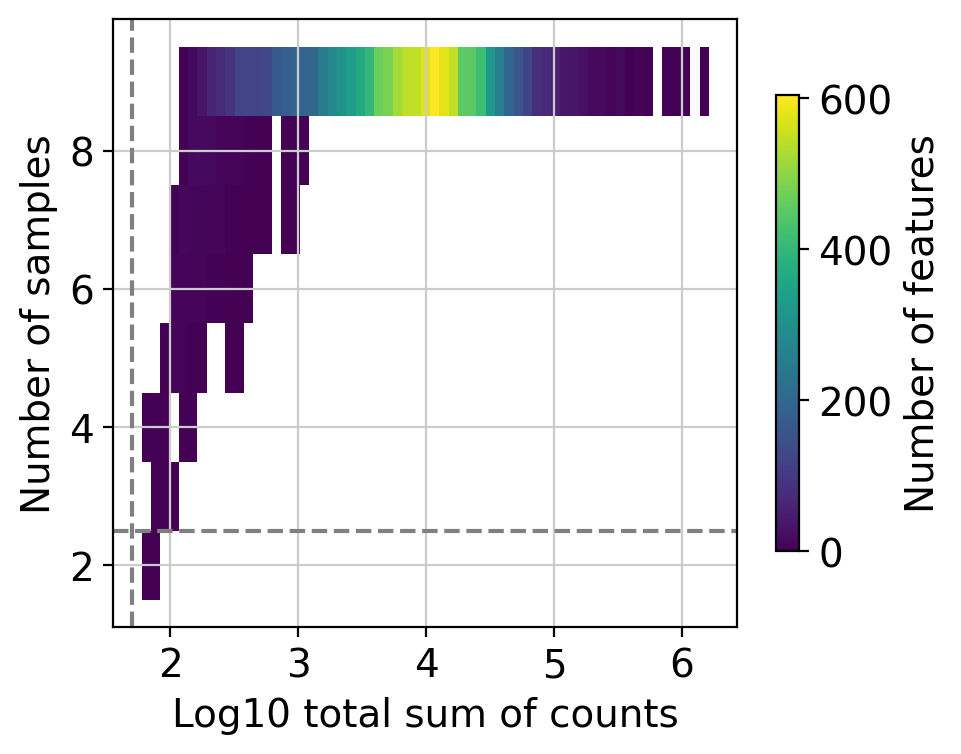

In [25]:
dc.plot_filter_by_expr(pdata, group='treatment', min_count=10, min_total_count=50)

In [26]:
# Obtain genes that pass the thresholds
genes = dc.filter_by_expr(pdata, group='treatment', min_count=10, min_total_count=50)

# Filter by these genes
pdata = pdata[:, genes].copy()
pdata

AnnData object with n_obs × n_vars = 9 × 11447
    obs: 'week', 'treatment', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'soupx_contamination', 'sample', 'psbulk_n_cells', 'psbulk_counts'
    var: 'mean', 'std', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'week_colors', 'treatment_colors', 'pca_anova'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props', 'counts'

In [27]:
# Import DESeq2
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# Build DESeq2 object
inference = DefaultInference(n_cpus=8)
dds = DeseqDataSet(adata=pdata, design_factors='treatment', 
    ref_level=['treatment', 'Control'], refit_cooks=True,
    inference=inference)
dds2 = DeseqDataSet(adata=pdata, design_factors='treatment', 
    ref_level=['treatment', 'Conti'], refit_cooks=True,
    inference=inference)
# Compute LFCs
dds.deseq2()
dds2.deseq2()

Using None as control genes, passed at DeseqDataSet initialization


/data/cephfs-1/home/users/cemo10_c/scratch/tmp/hpc-mem-2/ipykernel_1554134/1918929930.py:7: DeprecationWarning: ref_level is deprecated and no longer has any effect. It will beremoved in a future release.
  dds = DeseqDataSet(adata=pdata, design_factors='treatment',
/data/cephfs-1/home/users/cemo10_c/scratch/tmp/hpc-mem-2/ipykernel_1554134/1918929930.py:7: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(adata=pdata, design_factors='treatment',
/data/cephfs-1/home/users/cemo10_c/scratch/tmp/hpc-mem-2/ipykernel_1554134/1918929930.py:10: DeprecationWarning: ref_level is deprecated and no longer has any effect. It will beremoved in a future release.
  dds2 = DeseqDataSet(adata=pdata, design_factors='treatment',
/data/cephfs-1/home/users/cemo10_c/scratch/tmp/hpc-mem-2/ipykernel_1554134/1918929930.py:10: DeprecationWarning: design_factors is deprecated and will soon 

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 3.41 seconds.

Fitting dispersion trend curve...
... done in 0.79 seconds.

Fitting MAP dispersions...
... done in 3.98 seconds.

Fitting LFCs...
... done in 1.95 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.



In [28]:
# Extract contrast 
stat_res_onoff = DeseqStats(dds, contrast=["treatment", 'OnOff', 'Control'], inference=inference)
stat_res_conti = DeseqStats(dds, contrast=["treatment", 'Conti', 'Control'], inference=inference)
stat_res_conoo = DeseqStats(dds, contrast=["treatment", 'OnOff', 'Conti'], inference=inference)

# Compute Wald test
stat_res_onoff.summary()
stat_res_conti.summary()
stat_res_conoo.summary()

Running Wald tests...
... done in 1.28 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment OnOff vs Control
           baseMean  log2FoldChange     lfcSE       stat        pvalue  \
A1CF     533.086444       -0.280479  0.179387  -1.563542  1.179251e-01   
A4GALT   605.157169        1.101345  0.106745  10.317562  5.869451e-25   
AAAS    1852.334749       -0.227161  0.066084  -3.437447  5.872253e-04   
AACS    2913.657944       -0.579653  0.085692  -6.764367  1.338936e-11   
AADAT    128.322837       -1.488584  0.302583  -4.919594  8.672384e-07   
...             ...             ...       ...        ...           ...   
ZXDB      89.462269       -0.125702  0.299123  -0.420234  6.743142e-01   
ZXDC    1403.610295       -0.038732  0.087491  -0.442703  6.579805e-01   
ZYG11B  1412.555610        0.094896  0.073393   1.292986  1.960157e-01   
ZYX     4288.177233       -0.046063  0.106942  -0.430729  6.666652e-01   
ZZEF1   1502.890141        0.490681  0.075848   6.469269  9.847810e-11   

                padj  
A1CF    1.809260e-01  


... done in 1.19 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment Conti vs Control
           baseMean  log2FoldChange     lfcSE       stat        pvalue  \
A1CF     533.086444       -0.020748  0.178762  -0.116064  9.076017e-01   
A4GALT   605.157169        1.581039  0.105429  14.996191  7.775586e-51   
AAAS    1852.334749       -0.291185  0.066220  -4.397230  1.096414e-05   
AACS    2913.657944       -0.511601  0.085623  -5.975067  2.299963e-09   
AADAT    128.322837       -1.694166  0.304597  -5.561989  2.667176e-08   
...             ...             ...       ...        ...           ...   
ZXDB      89.462269       -0.377522  0.301396  -1.252575  2.103605e-01   
ZXDC    1403.610295       -0.152018  0.087706  -1.733269  8.304791e-02   
ZYG11B  1412.555610        0.129841  0.073334   1.770543  7.663669e-02   
ZYX     4288.177233        0.071835  0.106884   0.672089  5.015272e-01   
ZZEF1   1502.890141        0.551123  0.075751   7.275452  3.452627e-13   

                padj  
A1CF    9.310258e-01  


... done in 1.40 seconds.



OnOff vs Control weeks 2-4
Continuous vs Control weeks 2-4
OnOff vs Continuous weeks 2-4


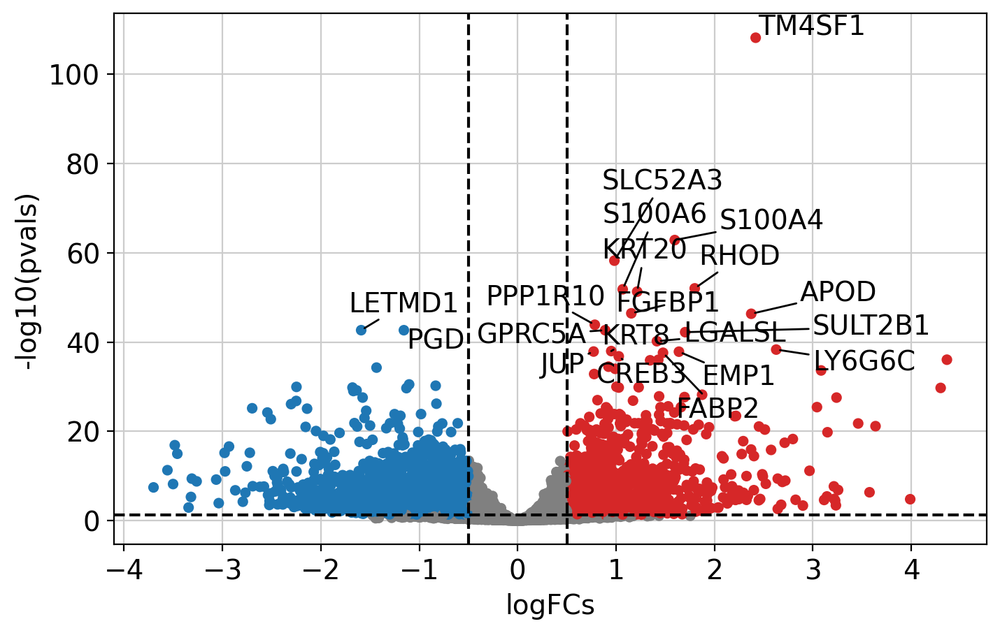

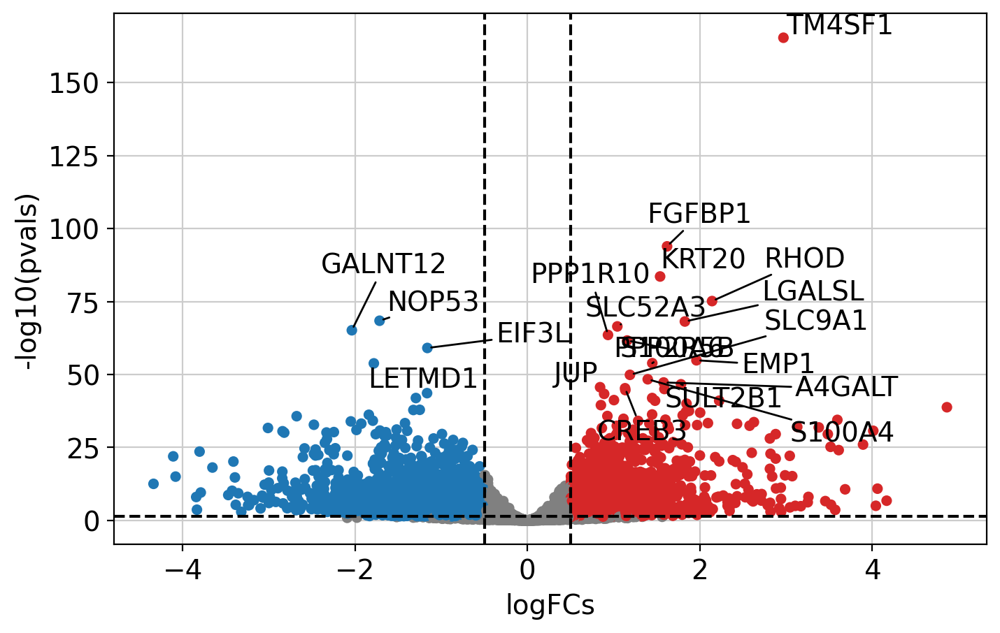

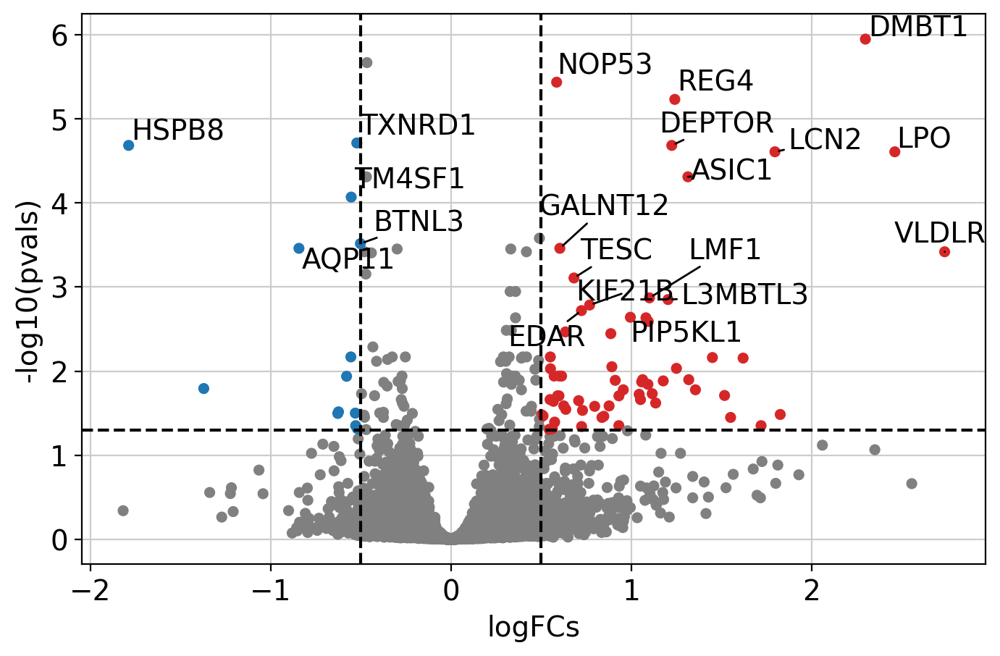

In [ ]:
# Extract results
results_df_onoff = stat_res_onoff.results_df
results_df_conti = stat_res_conti.results_df
results_df_conoo = stat_res_conoo.results_df

dc.plot_volcano_df(results_df_onoff, x='log2FoldChange', y='padj', top=20, figsize=(8, 5))
dc.plot_volcano_df(results_df_conti, x='log2FoldChange', y='padj', top=20, figsize=(8, 5))
dc.plot_volcano_df(results_df_conoo, x='log2FoldChange', y='padj', top=20, figsize=(8, 5))

## PROGENy with pseudo-bulk

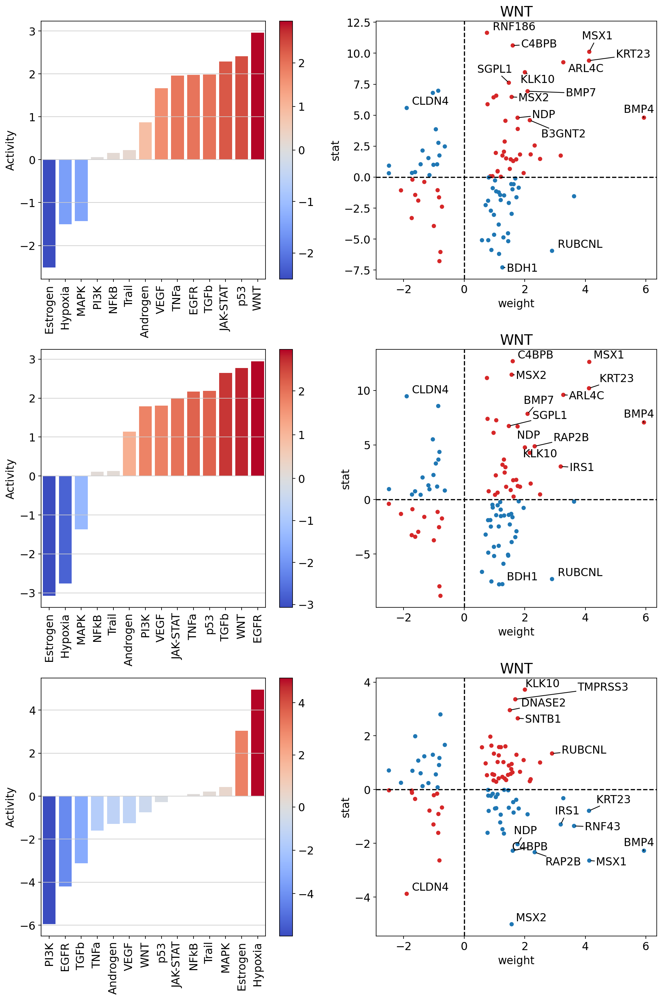

In [31]:
mat_onoff = results_df_onoff[['stat']].T.rename(index={'stat': 'OnOff'})
mat_conti = results_df_conti[['stat']].T.rename(index={'stat': 'Conti'})
mat_conoo = results_df_conoo[['stat']].T.rename(index={'stat': 'OnOff'})

# Infer pathway activities with mlm
pathway_acts_onoff, pathway_pvals_onoff = dc.run_mlm(mat=mat_onoff, net=progeny)
pathway_acts_conti, pathway_pvals_conti = dc.run_mlm(mat=mat_conti, net=progeny)
pathway_acts_conoo, pathway_pvals_conoo = dc.run_mlm(mat=mat_conoo, net=progeny)

fig, axes = plt.subplots(3, 2, figsize=(12, 18))

# Plot barplots
dc.plot_barplot(acts=pathway_acts_onoff, contrast='OnOff', top=25, vertical=False, ax=axes[0, 0])
dc.plot_barplot(acts=pathway_acts_conti, contrast='Conti', top=25, vertical=False, ax=axes[1, 0])
dc.plot_barplot(acts=pathway_acts_conoo, contrast='OnOff', top=25, vertical=False, ax=axes[2, 0])

# Plot targets
dc.plot_targets(data=results_df_onoff, stat='stat', source_name='WNT', net=progeny, top=15, ax=axes[0, 1])
dc.plot_targets(data=results_df_conti, stat='stat', source_name='WNT', net=progeny, top=15, ax=axes[1, 1])
dc.plot_targets(data=results_df_conoo, stat='stat', source_name='WNT', net=progeny, top=15, ax=axes[2, 1])

plt.tight_layout()
plt.show()